In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from helpers.dataset import dataset_experiments, compute_spectrum, compute_cospectrum
%load_ext autoreload
%autoreload 2
import matplotlib
matplotlib.rcParams['figure.dpi'] = 100

In [74]:
common_folder = '/scratch/pp2681/mom6'

# FGR study

In [3]:
exps = ('Feb2022/bare/R4', 'Feb2022/bare/R8', 'Feb2022/bare/R32', 'Feb2022/bare/R64',
        'Mar2022/R4/FGR/FGR1',  'Mar2022/R4/FGR/FGR2',  'Mar2022/R4/FGR/FGR22',  'Mar2022/R4/FGR/FGR24',  'Mar2022/R4/FGR/FGR26',  'Mar2022/R4/FGR/FGR28',  'Mar2022/R4/FGR/FGR3',
        'Mar2022/R8/FGR/FGR1',  'Mar2022/R8/FGR/FGR2',  'Mar2022/R8/FGR/FGR22',  'Mar2022/R8/FGR/FGR24',  'Mar2022/R8/FGR/FGR26',  'Mar2022/R8/FGR/FGR28',  'Mar2022/R8/FGR/FGR3',
        'Mar2022/R4/Visc/Cs006', 'Mar2022/R4/Visc/Cs004', 'Mar2022/R4/Visc/Cs002', 'Mar2022/R4/Visc/Cs001', 
        'Mar2022/R4/Filter/iter1_order1',  'Mar2022/R4/Filter/iter1_order3', 'Mar2022/R4/Filter/iter2_order1', 'Mar2022/R4/Filter/iter8_order1', 'Mar2022/R4/Filter/iter8_order3',
        'Mar2022/R4/Filter/iter1_order2',  'Mar2022/R4/Filter/iter1_order4', 'Mar2022/R4/Filter/iter4_order1',  'Mar2022/R4/Filter/iter8_order2',
        'Mar2022/test'
       )

In [4]:
ds = dataset_experiments(common_folder, exps)

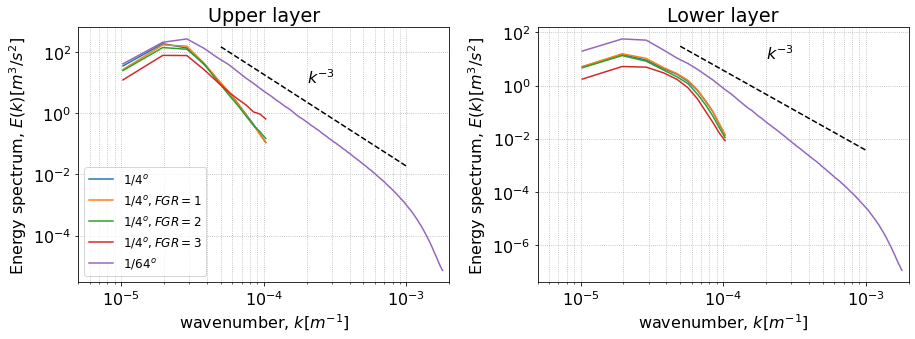

In [138]:
ds.plot_KE_spectrum(('Feb2022/bare/R4', 'Mar2022/R4/FGR/FGR1', 'Mar2022/R4/FGR/FGR2', 'Mar2022/R4/FGR/FGR3', 'Feb2022/bare/R64'),
                    names = ('$1/4^o$', '$1/4^o, FGR=1$', '$1/4^o, FGR=2$', '$1/4^o, FGR=3$', '$1/64^o$'), tstart=3650., Lat=(35,45), Lon=(5,15), window='hanning', nfactor=1, nd_wavenumber=False)
plt.savefig('R4_spec.png', dpi=150)

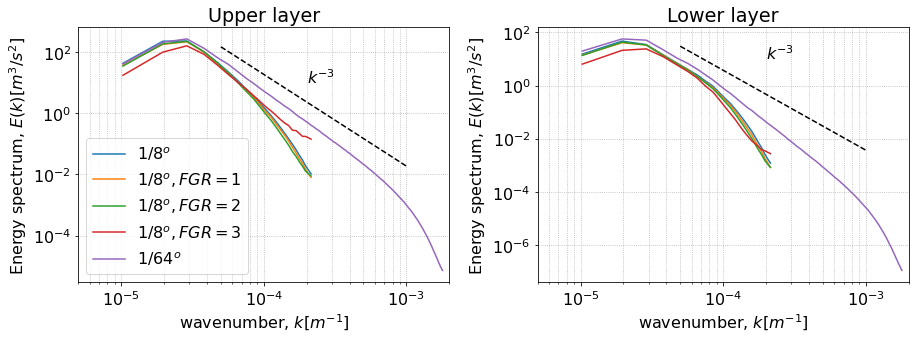

In [40]:
ds.plot_KE_spectrum(('Feb2022/bare/R8', 'Mar2022/R8/FGR/FGR1', 'Mar2022/R8/FGR/FGR2', 'Mar2022/R8/FGR/FGR3', 'Feb2022/bare/R64'),
                    names = ('$1/8^o$', '$1/8^o, FGR=1$', '$1/8^o, FGR=2$', '$1/8^o, FGR=3$', '$1/64^o$'), tstart=3650., Lat=(35,45), Lon=(5,15), window='hanning', nfactor=1, nd_wavenumber=False)
plt.savefig('R8_spec.png', dpi=150)

<Figure size 1080x540 with 0 Axes>

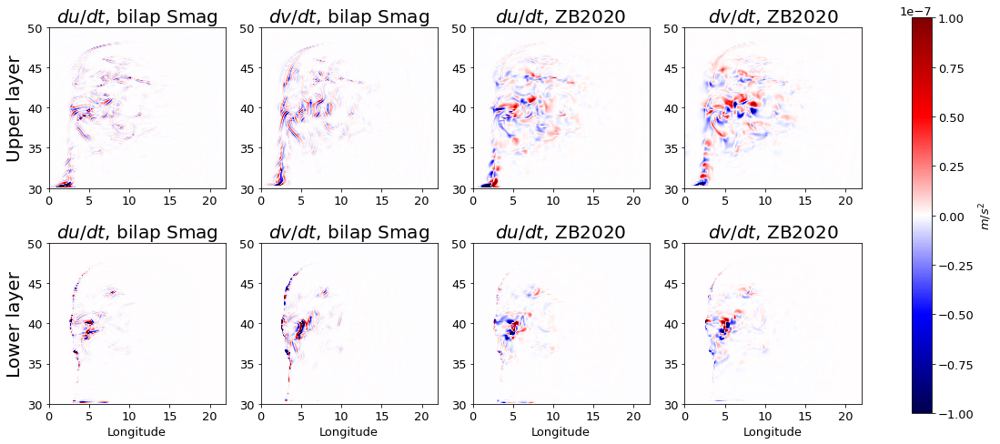

In [16]:
ds.plot_SGS_snapshot('Mar2022/R8/FGR/FGR2', Time = -6)
plt.savefig('ZB_snapshot.png', dpi=150)

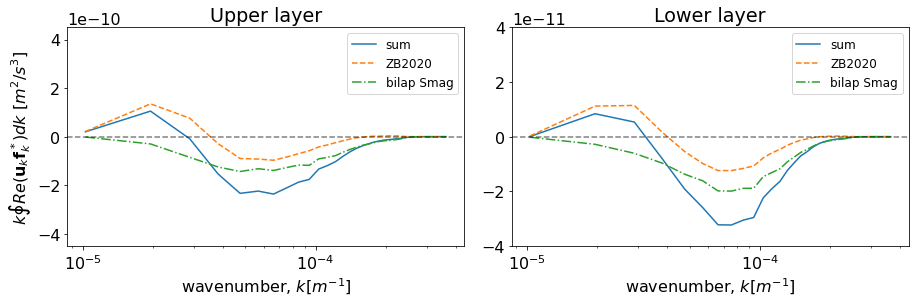

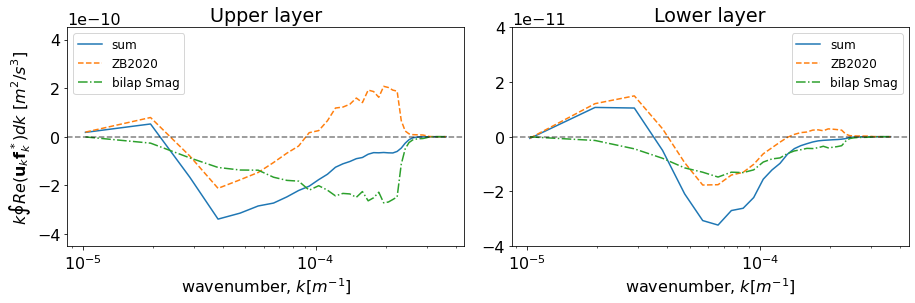

In [140]:
ds.plot_cospectrum_componentwise(['Mar2022/R8/FGR/FGR2'], tstart = 3650., Lat=(35,45), Lon=(5,15), window='hanning', averaging=False, nfactor=1, truncate=False, nd_wavenumber=False)
plt.savefig('cospectrum_R8_FGR2.png', dpi=150)
ds.plot_cospectrum_componentwise(['Mar2022/R8/FGR/FGR3'], tstart = 3650., Lat=(35,45), Lon=(5,15), window='hanning', averaging=False, nfactor=1, truncate=False, nd_wavenumber=False)
plt.savefig('cospectrum_R8_FGR3.png', dpi=150)

# Visc study

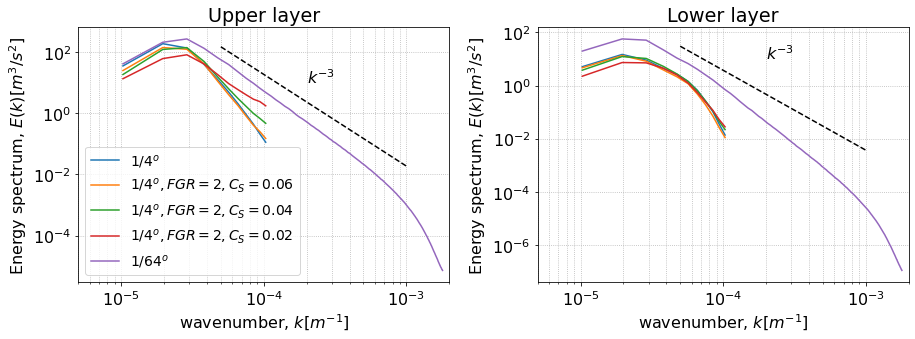

In [18]:
ds.plot_KE_spectrum(('Feb2022/bare/R4', 'Mar2022/R4/Visc/Cs006', 'Mar2022/R4/Visc/Cs004', 'Mar2022/R4/Visc/Cs002', 'Feb2022/bare/R64'),
                    names = ('$1/4^o$', '$1/4^o, FGR=2, C_S=0.06$', '$1/4^o, FGR=2, C_S=0.04$', '$1/4^o, FGR=2, C_S=0.02$', '$1/64^o$'), 
                    tstart=3650., Lat=(35,45), Lon=(5,15), window='hanning', nfactor=1, nd_wavenumber=False)
plt.savefig('R4_visc.png', dpi=150)

# Filter study

In [141]:
exps = ('Feb2022/bare/R4', 'Feb2022/bare/R8', 'Feb2022/bare/R32', 'Feb2022/bare/R64',
        'Mar2022/R4/FGR/FGR3',
        'Mar2022/R4/Filter/iter1_order1',  'Mar2022/R4/Filter/iter1_order3', 'Mar2022/R4/Filter/iter2_order1', 'Mar2022/R4/Filter/iter8_order1', 'Mar2022/R4/Filter/iter8_order3',
        'Mar2022/R4/Filter/iter1_order2',  'Mar2022/R4/Filter/iter1_order4', 'Mar2022/R4/Filter/iter4_order1',  'Mar2022/R4/Filter/iter8_order2'
       )

In [142]:
ds = dataset_experiments(common_folder, exps)

<Figure size 1080x540 with 0 Axes>

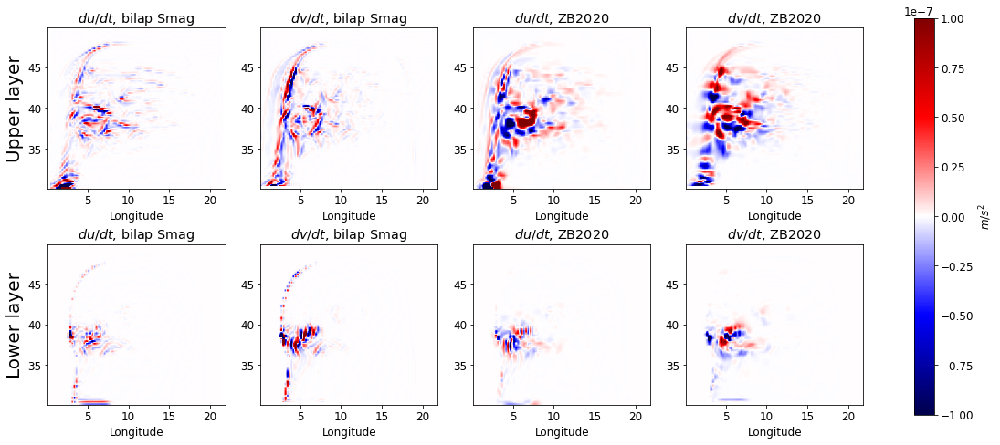

In [112]:
ds.plot_SGS_snapshot('Mar2022/R4/Filter/iter8_order3', Time = -6)
plt.savefig('look_at_me.png', dpi=150)

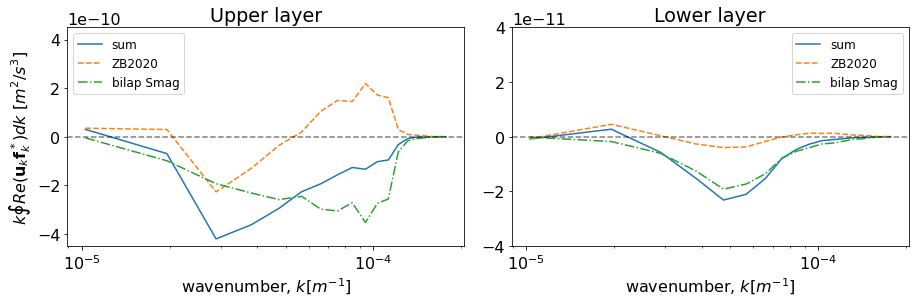

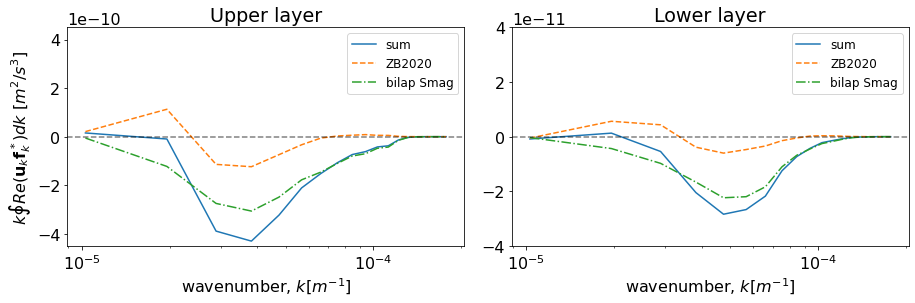

In [143]:
ds.plot_cospectrum_componentwise(['Mar2022/R4/FGR/FGR3'], tstart = 3650., Lat=(35,45), Lon=(5,15), window='hanning', averaging=False, nfactor=1, truncate=False, nd_wavenumber=False)
plt.savefig('R4_before_filtering.png', dpi=150)
ds.plot_cospectrum_componentwise(['Mar2022/R4/Filter/iter8_order2'], tstart = 3650., Lat=(35,45), Lon=(5,15), window='hanning', averaging=False, nfactor=1, truncate=False, nd_wavenumber=False)
plt.savefig('R4_after_filtering.png', dpi=150)

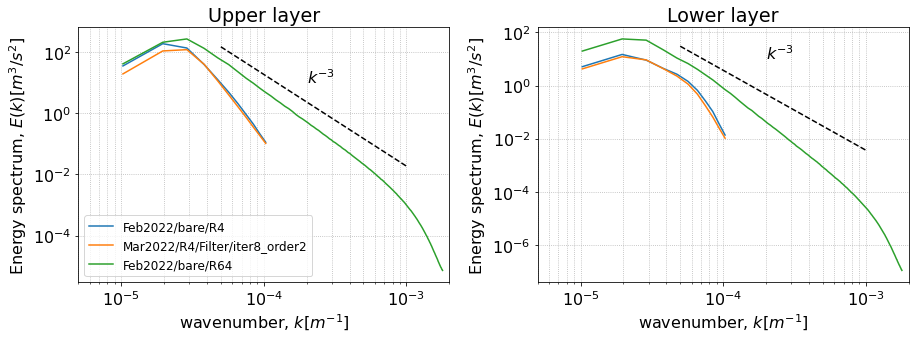

In [131]:
ds.plot_KE_spectrum(('Feb2022/bare/R4', 'Mar2022/R4/Filter/iter8_order2', 'Feb2022/bare/R64'),
                    #names = ('$1/4^o$', '$1/4^o, FGR=2, C_S=0.06$', '$1/4^o, FGR=2, C_S=0.04$', '$1/4^o, FGR=2, C_S=0.02$', '$1/64^o$'), 
                    tstart=3650., Lat=(35,45), Lon=(5,15), window='hanning', nfactor=1, nd_wavenumber=False)

# SSH R4

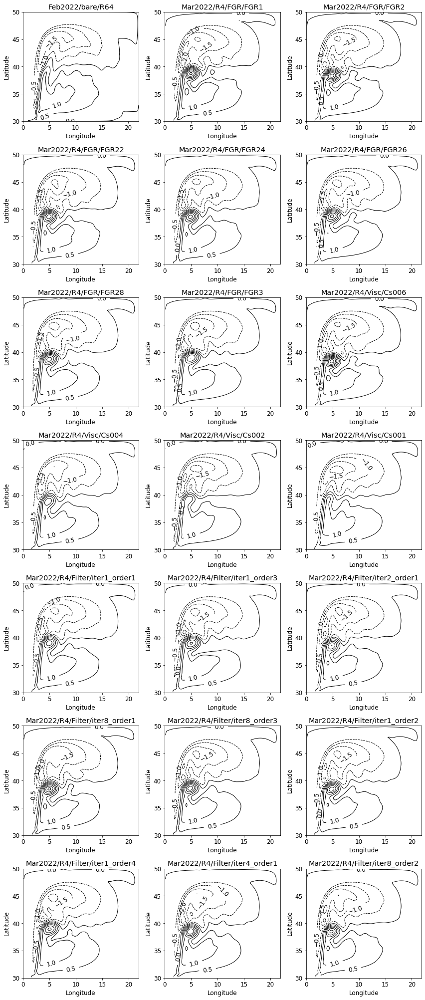

In [29]:
ds.plot_ssh(('Feb2022/bare/R64','Mar2022/R4/FGR/FGR1',  'Mar2022/R4/FGR/FGR2',  'Mar2022/R4/FGR/FGR22',  'Mar2022/R4/FGR/FGR24',  'Mar2022/R4/FGR/FGR26',  'Mar2022/R4/FGR/FGR28',  'Mar2022/R4/FGR/FGR3',
        'Mar2022/R4/Visc/Cs006', 'Mar2022/R4/Visc/Cs004', 'Mar2022/R4/Visc/Cs002', 'Mar2022/R4/Visc/Cs001', 
        'Mar2022/R4/Filter/iter1_order1',  'Mar2022/R4/Filter/iter1_order3', 'Mar2022/R4/Filter/iter2_order1', 'Mar2022/R4/Filter/iter8_order1', 'Mar2022/R4/Filter/iter8_order3',
        'Mar2022/R4/Filter/iter1_order2',  'Mar2022/R4/Filter/iter1_order4', 'Mar2022/R4/Filter/iter4_order1',  'Mar2022/R4/Filter/iter8_order2'))

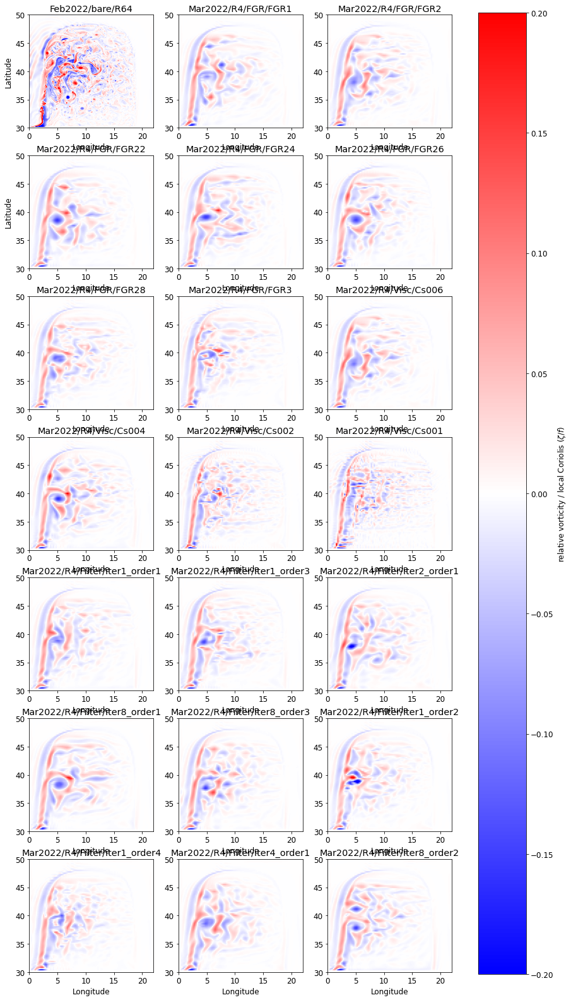

In [31]:
ds.plot_relative_vorticity_snapshot(('Feb2022/bare/R64','Mar2022/R4/FGR/FGR1',  'Mar2022/R4/FGR/FGR2',  'Mar2022/R4/FGR/FGR22',  'Mar2022/R4/FGR/FGR24',  'Mar2022/R4/FGR/FGR26',  'Mar2022/R4/FGR/FGR28',  'Mar2022/R4/FGR/FGR3',
        'Mar2022/R4/Visc/Cs006', 'Mar2022/R4/Visc/Cs004', 'Mar2022/R4/Visc/Cs002', 'Mar2022/R4/Visc/Cs001', 
        'Mar2022/R4/Filter/iter1_order1',  'Mar2022/R4/Filter/iter1_order3', 'Mar2022/R4/Filter/iter2_order1', 'Mar2022/R4/Filter/iter8_order1', 'Mar2022/R4/Filter/iter8_order3',
        'Mar2022/R4/Filter/iter1_order2',  'Mar2022/R4/Filter/iter1_order4', 'Mar2022/R4/Filter/iter4_order1',  'Mar2022/R4/Filter/iter8_order2'))

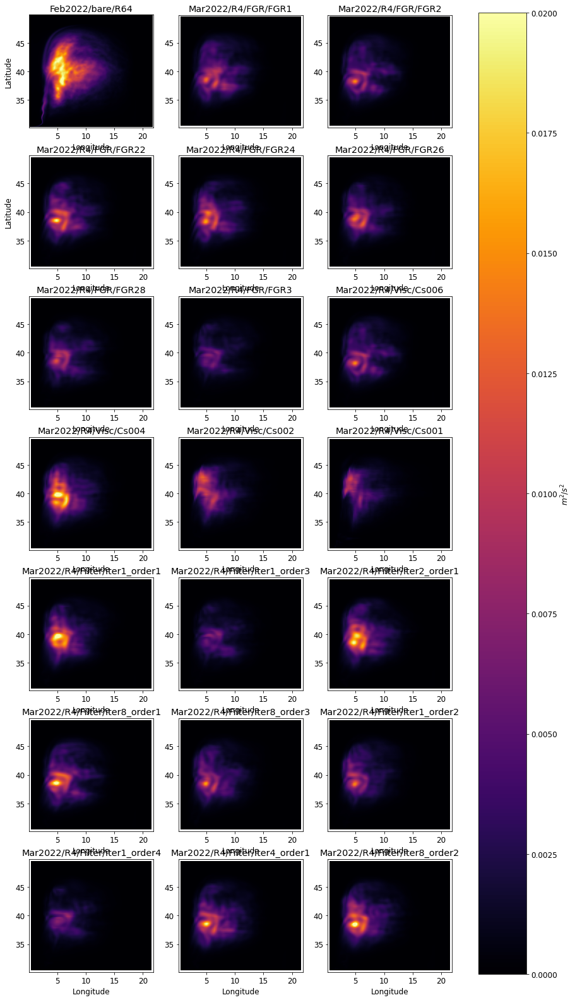

In [32]:
ds.plot_EKE(('Feb2022/bare/R64','Mar2022/R4/FGR/FGR1',  'Mar2022/R4/FGR/FGR2',  'Mar2022/R4/FGR/FGR22',  'Mar2022/R4/FGR/FGR24',  'Mar2022/R4/FGR/FGR26',  'Mar2022/R4/FGR/FGR28',  'Mar2022/R4/FGR/FGR3',
        'Mar2022/R4/Visc/Cs006', 'Mar2022/R4/Visc/Cs004', 'Mar2022/R4/Visc/Cs002', 'Mar2022/R4/Visc/Cs001', 
        'Mar2022/R4/Filter/iter1_order1',  'Mar2022/R4/Filter/iter1_order3', 'Mar2022/R4/Filter/iter2_order1', 'Mar2022/R4/Filter/iter8_order1', 'Mar2022/R4/Filter/iter8_order3',
        'Mar2022/R4/Filter/iter1_order2',  'Mar2022/R4/Filter/iter1_order4', 'Mar2022/R4/Filter/iter4_order1',  'Mar2022/R4/Filter/iter8_order2'))

# SSH R8

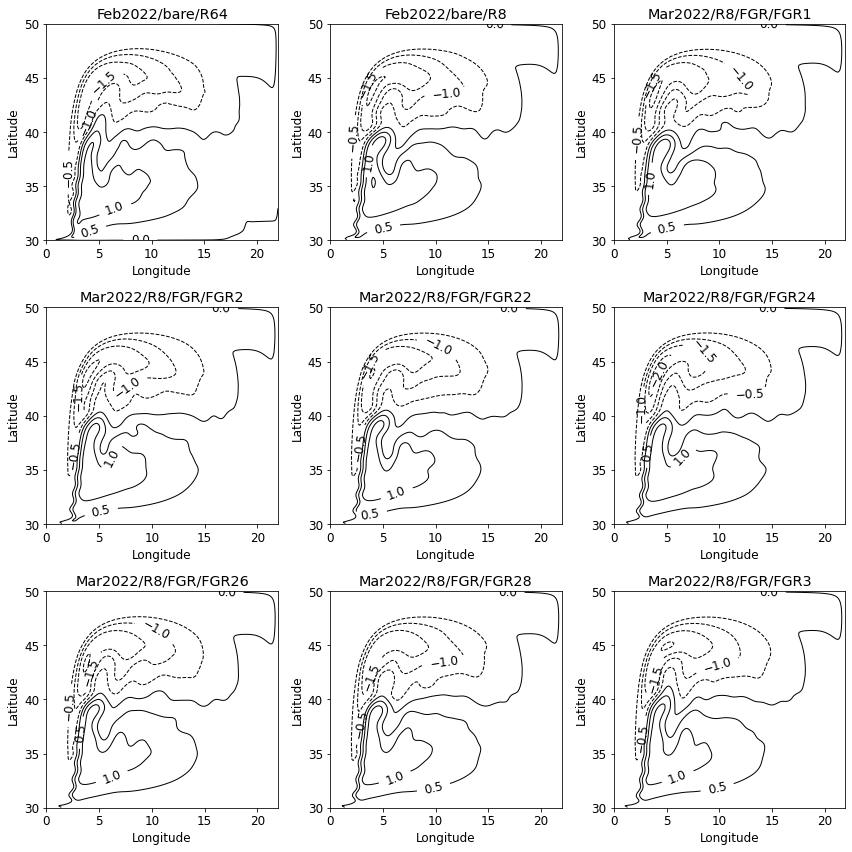

In [34]:
ds.plot_ssh(('Feb2022/bare/R64', 'Feb2022/bare/R8', 'Mar2022/R8/FGR/FGR1',  'Mar2022/R8/FGR/FGR2',  'Mar2022/R8/FGR/FGR22',  'Mar2022/R8/FGR/FGR24',  'Mar2022/R8/FGR/FGR26',  'Mar2022/R8/FGR/FGR28',  'Mar2022/R8/FGR/FGR3',))

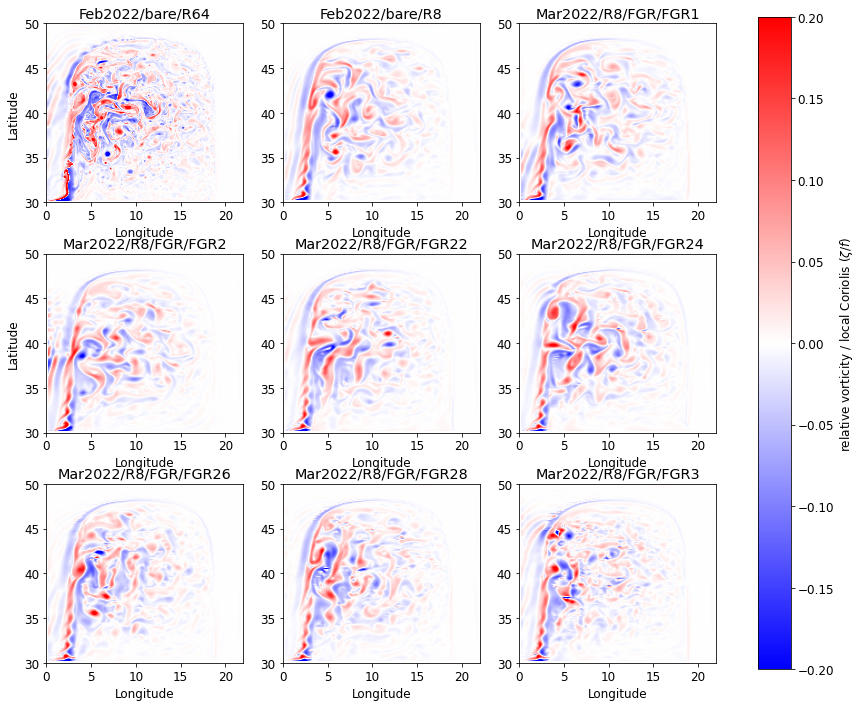

In [35]:
ds.plot_relative_vorticity_snapshot(('Feb2022/bare/R64', 'Feb2022/bare/R8', 'Mar2022/R8/FGR/FGR1',  'Mar2022/R8/FGR/FGR2',  'Mar2022/R8/FGR/FGR22',  'Mar2022/R8/FGR/FGR24',  'Mar2022/R8/FGR/FGR26',  'Mar2022/R8/FGR/FGR28',  'Mar2022/R8/FGR/FGR3',))

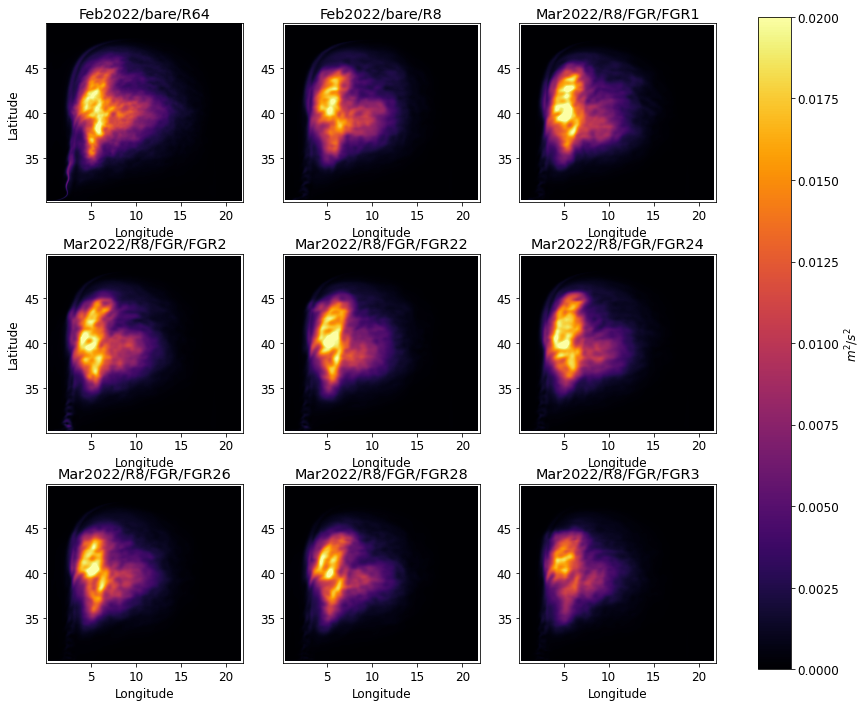

In [36]:
ds.plot_EKE(('Feb2022/bare/R64', 'Feb2022/bare/R8', 'Mar2022/R8/FGR/FGR1',  'Mar2022/R8/FGR/FGR2',  'Mar2022/R8/FGR/FGR22',  'Mar2022/R8/FGR/FGR24',  'Mar2022/R8/FGR/FGR26',  'Mar2022/R8/FGR/FGR28',  'Mar2022/R8/FGR/FGR3',))

# New filters

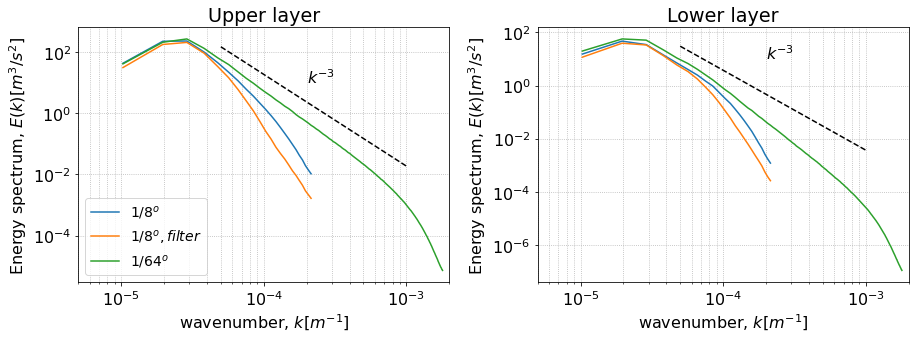

In [5]:
ds.plot_KE_spectrum(('Feb2022/bare/R8', 'Mar2022/test','Feb2022/bare/R64'),
                    names = ('$1/8^o$', '$1/8^o, filter$', '$1/64^o$'), 
                    tstart=3650., Lat=(35,45), Lon=(5,15), window='hanning', nfactor=1, nd_wavenumber=False)

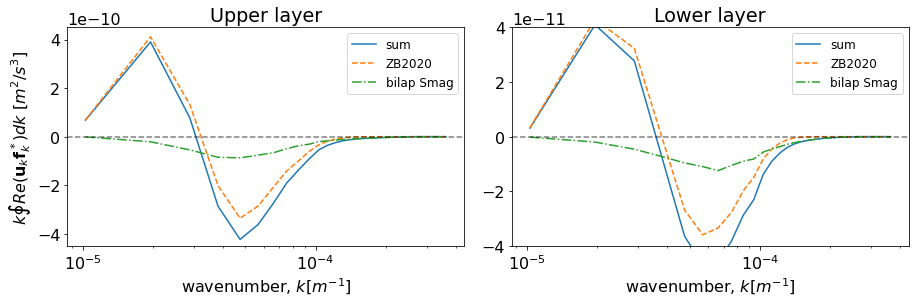

In [6]:
ds.plot_cospectrum_componentwise(['Mar2022/test'], tstart = 3650., Lat=(35,45), Lon=(5,15), window='hanning', averaging=False, nfactor=1, truncate=False, nd_wavenumber=False)

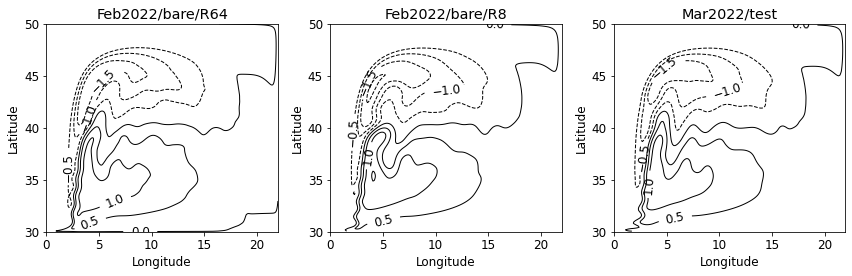

In [7]:
ds.plot_ssh(('Feb2022/bare/R64', 'Feb2022/bare/R8', 'Mar2022/test'))

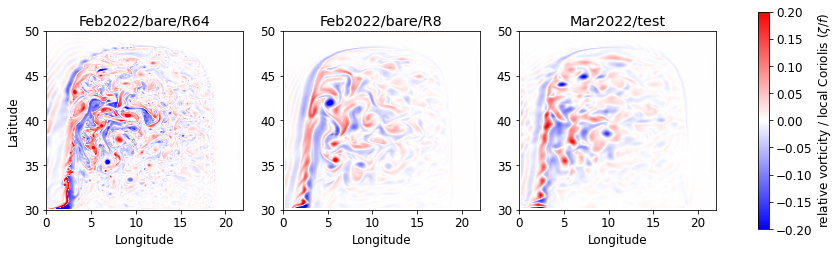

In [8]:
ds.plot_relative_vorticity_snapshot(('Feb2022/bare/R64', 'Feb2022/bare/R8', 'Mar2022/test'), zl=0)

# 210 Experiments with 1/4 degree model

In [170]:
common_folder = '/scratch/pp2681/mom6'

In [191]:
exps = ['Apr2022/R4/EXP'+str(i) for i in range(1,101)]
exps.append('Feb2022/bare/R32')
print(exps)

['Apr2022/R4/EXP1', 'Apr2022/R4/EXP2', 'Apr2022/R4/EXP3', 'Apr2022/R4/EXP4', 'Apr2022/R4/EXP5', 'Apr2022/R4/EXP6', 'Apr2022/R4/EXP7', 'Apr2022/R4/EXP8', 'Apr2022/R4/EXP9', 'Apr2022/R4/EXP10', 'Apr2022/R4/EXP11', 'Apr2022/R4/EXP12', 'Apr2022/R4/EXP13', 'Apr2022/R4/EXP14', 'Apr2022/R4/EXP15', 'Apr2022/R4/EXP16', 'Apr2022/R4/EXP17', 'Apr2022/R4/EXP18', 'Apr2022/R4/EXP19', 'Apr2022/R4/EXP20', 'Apr2022/R4/EXP21', 'Apr2022/R4/EXP22', 'Apr2022/R4/EXP23', 'Apr2022/R4/EXP24', 'Apr2022/R4/EXP25', 'Apr2022/R4/EXP26', 'Apr2022/R4/EXP27', 'Apr2022/R4/EXP28', 'Apr2022/R4/EXP29', 'Apr2022/R4/EXP30', 'Apr2022/R4/EXP31', 'Apr2022/R4/EXP32', 'Apr2022/R4/EXP33', 'Apr2022/R4/EXP34', 'Apr2022/R4/EXP35', 'Apr2022/R4/EXP36', 'Apr2022/R4/EXP37', 'Apr2022/R4/EXP38', 'Apr2022/R4/EXP39', 'Apr2022/R4/EXP40', 'Apr2022/R4/EXP41', 'Apr2022/R4/EXP42', 'Apr2022/R4/EXP43', 'Apr2022/R4/EXP44', 'Apr2022/R4/EXP45', 'Apr2022/R4/EXP46', 'Apr2022/R4/EXP47', 'Apr2022/R4/EXP48', 'Apr2022/R4/EXP49', 'Apr2022/R4/EXP50', 'Apr2022

In [192]:
ds = dataset_experiments(common_folder, exps)

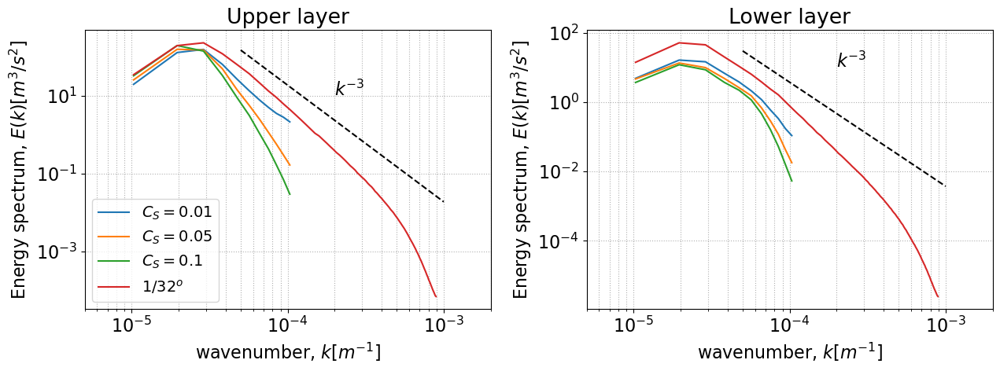

In [186]:
ds.plot_KE_spectrum(['Apr2022/R4/EXP1', 'Apr2022/R4/EXP5', 'Apr2022/R4/EXP10', 'Feb2022/bare/R32'], names=['$C_S=0.01$', '$C_S=0.05$', '$C_S=0.1$', '$1/32^o$'], tstart=3650., Lat=(35,45), Lon=(5,15), window='hanning', nfactor=1, nd_wavenumber=False)

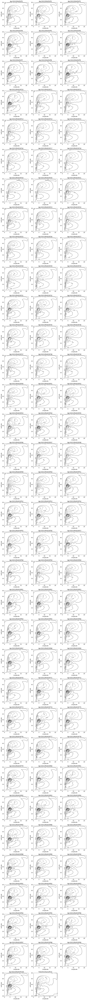

In [193]:
ds.plot_ssh(exps)

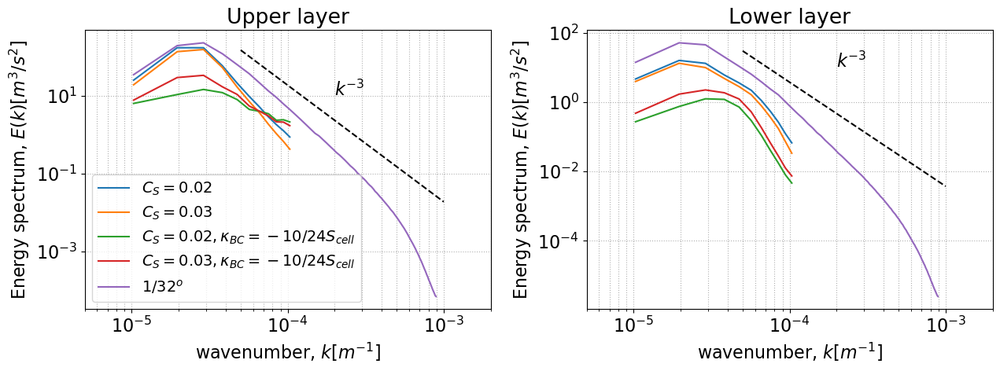

In [201]:
ds.plot_KE_spectrum(['Apr2022/R4/EXP2', 'Apr2022/R4/EXP3', 'Apr2022/R4/EXP30', 'Apr2022/R4/EXP40', 'Feb2022/bare/R32'], 
names=['$C_S=0.02$', '$C_S=0.03$', '$C_S=0.02, \kappa_{BC}=-10/24 S_{cell}$', '$C_S=0.03, \kappa_{BC}=-10/24 S_{cell}$', '$1/32^o$'], tstart=3650., Lat=(35,45), Lon=(5,15), window='hanning', nfactor=1, nd_wavenumber=False)

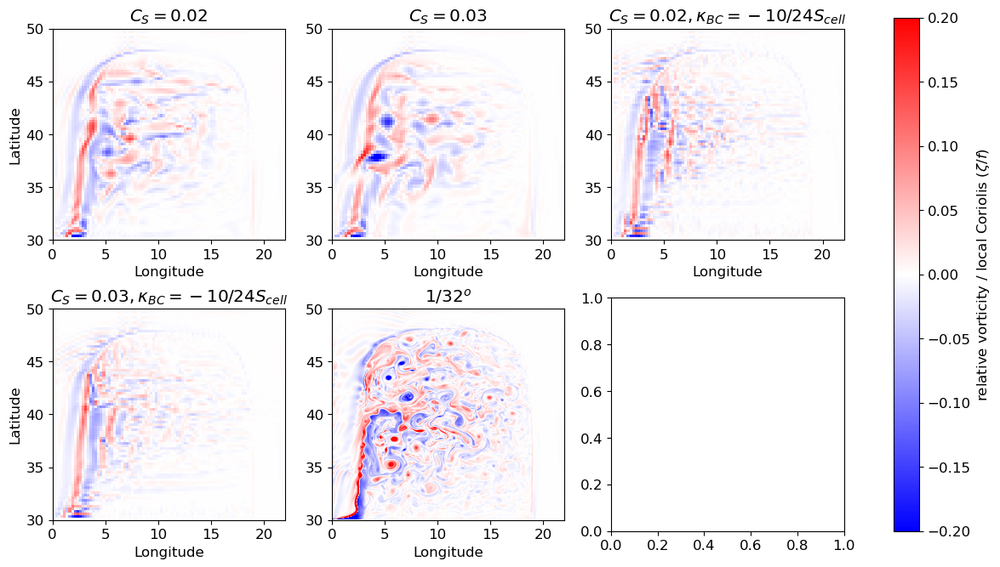

In [208]:
ds.plot_relative_vorticity_snapshot(['Apr2022/R4/EXP2', 'Apr2022/R4/EXP3', 'Apr2022/R4/EXP30', 'Apr2022/R4/EXP40', 'Feb2022/bare/R32'], 
names=['$C_S=0.02$', '$C_S=0.03$', '$C_S=0.02, \kappa_{BC}=-10/24 S_{cell}$', '$C_S=0.03, \kappa_{BC}=-10/24 S_{cell}$', '$1/32^o$'], zl=0, Time=-1)